# Data Description:

**What is Airbnb?**

* Airbnb: “Air Bed and Breakfast”
* A service that lets property owners rent out their spaces to travelers looking for a place to stay.
* Travelers can rent a space for multiple people to share, a shared space with private rooms, or the entire property for themselves.

This dataset contains information about the listings of Airbnb in New York City. The data is collected from the Airbnb website in the year 2019. The data contains 48895 rows and 16 columns. The data contains information about the neighbourhood, room type, price, minimum number of nights, number of reviews, last review, reviews per month, calculated host listings count, availability 365, latitude, longitude, neighbourhood group, name, host id, host name, and host since

# Importing Libraries

In [ ]:
!pip install opendatasets
!pip install ydata-profiling

In [ ]:
import pandas as pd
import seaborn as sns
import geopy.distance
import opendatasets as od
import plotly.express as px
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
sns.set()

# Loading the data

In [ ]:
od.download("https://www.kaggle.com/datasets/dgomonov/new-york-city-airbnb-open-data/data")

In [6]:
df = pd.read_csv('/content/new-york-city-airbnb-open-data/AB_NYC_2019.csv')

# Exploring the Data

In [7]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [9]:
pd.options.display.float_format = '{:,.2f}'.format

In [10]:
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,"48,895.00","48,895.00","48,895.00","48,895.00","48,895.00","48,895.00","48,895.00","38,843.00","48,895.00","48,895.00"
mean,"19,017,143.24","67,620,010.65",40.73,-73.95,152.72,7.03,23.27,1.37,7.14,112.78
std,"10,983,108.39","78,610,967.03",0.05,0.05,240.15,20.51,44.55,1.68,32.95,131.62
min,"2,539.00","2,438.00",40.50,-74.24,0.00,1.00,0.00,0.01,1.00,0.00
25%,"9,471,945.00","7,822,033.00",40.69,-73.98,69.00,1.00,1.00,0.19,1.00,0.00
50%,"19,677,284.00","30,793,816.00",40.72,-73.96,106.00,3.00,5.00,0.72,1.00,45.00
75%,"29,152,178.50","107,434,423.00",40.76,-73.94,175.00,5.00,24.00,2.02,2.00,227.00
max,"36,487,245.00","274,321,313.00",40.91,-73.71,"10,000.00","1,250.00",629.00,58.50,327.00,365.00


In [11]:
df.describe(include='O')

,name,host_name,neighbourhood_group,neighbourhood,room_type,last_review
count,48879,48874,48895,48895,48895,38843
unique,47905,11452,5,221,3,1764
top,Hillside Hotel,Michael,Manhattan,Williamsburg,Entire home/apt,2019-06-23
freq,18,417,21661,3920,25409,1413


In [12]:
df.nunique()

,0
id,48895
name,47905
host_id,37457
host_name,11452
neighbourhood_group,5
neighbourhood,221
latitude,19048
longitude,14718
room_type,3
price,674


# Pandas Profiling

In [13]:
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 16/16 [00:01<00:00,  8.38it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Drop useless columns

    after checking `profiling` we found that
    some columns are useless -> drop them

In [14]:
df.drop(columns=['id', 'name', 'host_id', 'host_name'], inplace=True)

# Missing Values

In [15]:
df.isna().mean() * 100

,0
neighbourhood_group,0.00
neighbourhood,0.00
latitude,0.00
longitude,0.00
room_type,0.00
price,0.00
minimum_nights,0.00
number_of_reviews,0.00
last_review,20.56
reviews_per_month,20.56


    we will fill nulls in last_review by 01-01-1111
    so it will be useless

In [ ]:
df['last_review'] = pd.to_datetime(df['last_review'])
df['last_review'].fillna(pd.to_datetime('1911-01-01'), inplace=True)

    handle nulls in reviews_per_month by makes them 0

In [ ]:
df['reviews_per_month'].fillna(0, inplace=True)

# Adding distance Feature
contains the distance between the property and the city center

In [18]:
lat = 40.7128
lon = -74.0060

def get_distance(lat1, lon1, lat2=lat, lon2=lon):
    coords_1 = (lat1, lon1)
    coords_2 = (lat2, lon2)
    return geopy.distance.distance(coords_1, coords_2).km

df['distance'] = df.apply(lambda x: get_distance(x.latitude, x.longitude), axis=1)

# Features Analysis

In [19]:
df.sample()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,distance
25692,Brooklyn,Williamsburg,40.71,-73.94,Private room,70,1,1,2017-08-26,0.04,1,0,5.41


## Neighbourhood Group Analysis

In [20]:
df['neighbourhood_group'].value_counts(normalize=True)

,proportion
neighbourhood_group,
Manhattan,0.44
Brooklyn,0.41
Queens,0.12
Bronx,0.02
Staten Island,0.01


In [21]:
px.bar(df['neighbourhood_group'].value_counts(), title='Neighbourhood Group')

In [22]:
px.pie(df, names='neighbourhood_group', title='Neighbourhood Group')

In [23]:
df.groupby('neighbourhood_group')['price'].mean().sort_values(ascending=False)

,price
neighbourhood_group,
Manhattan,196.88
Brooklyn,124.38
Staten Island,114.81
Queens,99.52
Bronx,87.50


In [24]:
df.groupby(['neighbourhood_group', 'room_type'])['price'].mean().sort_values(ascending=False)

neighbourhood_group  room_type      
Manhattan            Entire home/apt   249.24
Brooklyn             Entire home/apt   178.33
Staten Island        Entire home/apt   173.85
Queens               Entire home/apt   147.05
Bronx                Entire home/apt   127.51
Manhattan            Private room      116.78
                     Shared room        88.98
Brooklyn             Private room       76.50
Queens               Private room       71.76
                     Shared room        69.02
Bronx                Private room       66.79
Staten Island        Private room       62.29
Bronx                Shared room        59.80
Staten Island        Shared room        57.44
Brooklyn             Shared room        50.53
Name: price, dtype: float64

In [25]:
order = ['Entire home/apt', 'Private room', 'Shared room']

<Axes: xlabel='neighbourhood_group', ylabel='price'>

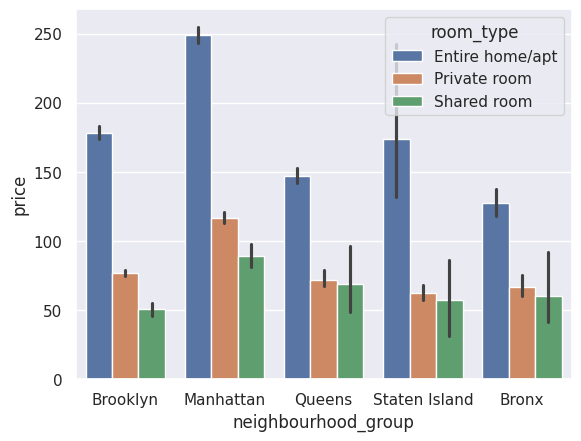

In [26]:
sns.barplot(x='neighbourhood_group', y='price', hue='room_type', hue_order=order ,data=df)

In [27]:
data = df.groupby(['neighbourhood_group', 'room_type'])['price'].mean().nlargest(10).reset_index()
px.bar(data, x='room_type', y='price', color='neighbourhood_group', title='Average Price by Neighbourhood Group and Room Type')

    the most popular and expensive 'neighbourhood_group' is `Manhattan` then `Brooklyn` (Entire home/apt or Private room)
    the least popular and expensive 'neighbourhood_group' is 'Brooklyn' (Shared room)

## Neighbourhood Analysis

In [28]:
df['neighbourhood'].value_counts().nlargest(10)

,count
neighbourhood,
Williamsburg,3920
Bedford-Stuyvesant,3714
Harlem,2658
Bushwick,2465
Upper West Side,1971
Hell's Kitchen,1958
East Village,1853
Upper East Side,1798
Crown Heights,1564


<Axes: xlabel='count', ylabel='neighbourhood'>

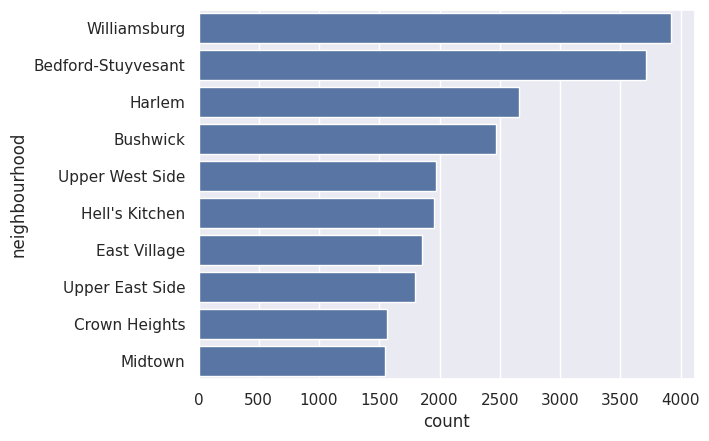

In [29]:
sns.countplot(data=df, y='neighbourhood', order=df['neighbourhood'].value_counts().head(10).index)

In [30]:
df['neighbourhood'].value_counts().nsmallest(10)

,count
neighbourhood,
Woodrow,1
Richmondtown,1
Fort Wadsworth,1
New Dorp,1
Rossville,1
Willowbrook,1
Co-op City,2
Westerleigh,2
Lighthouse Hill,2


    the most popular 'neighbourhood' is `Williamsburg` then `Bedford-Stuyvesant`
    the least popular 'neighbourhood' are `Woodrow`, `Richmondtown`, `New Dorp`, `Rossville`, `Rossville`, `Willowbrook`

In [31]:
df.groupby('neighbourhood')['price'].mean().nlargest(10)

,price
neighbourhood,
Fort Wadsworth,800.00
Woodrow,700.00
Tribeca,490.64
Sea Gate,487.86
Riverdale,442.09
Prince's Bay,409.50
Battery Park City,367.56
Flatiron District,341.93
Randall Manor,336.00


In [32]:
df.groupby('neighbourhood')['price'].mean().nsmallest(10)

,price
neighbourhood,
Bull's Head,47.33
Hunts Point,50.50
Tremont,51.55
Soundview,53.47
New Dorp,57.00
Bronxdale,57.11
New Dorp Beach,57.40
Grant City,57.67
Concord,58.19


    the most expensive 'neighbourhood' is `Fort Wadsworth`
    the least expensive 'neighbourhood' is `Bull's Head`

In [33]:
df.groupby(['neighbourhood', 'room_type'])['price'].mean().sort_values(ascending=False)

,,price
neighbourhood,room_type,
Riverdale,Private room,803.50
Fort Wadsworth,Entire home/apt,800.00
Riverdale,Shared room,800.00
Woodrow,Entire home/apt,700.00
Randall Manor,Entire home/apt,651.00
...,...,...
Graniteville,Private room,20.00
Schuylerville,Shared room,20.00
South Beach,Shared room,20.00


    the most expensive 'neighbourhood' by 'room_type' is `Riverdale`(Private room) then `Fort Wadsworth`(Entire home/apt)
    the least expensive 'neighbourhood' by 'room_type' is `Randall Manor`(Shared room)

## Location Analysis

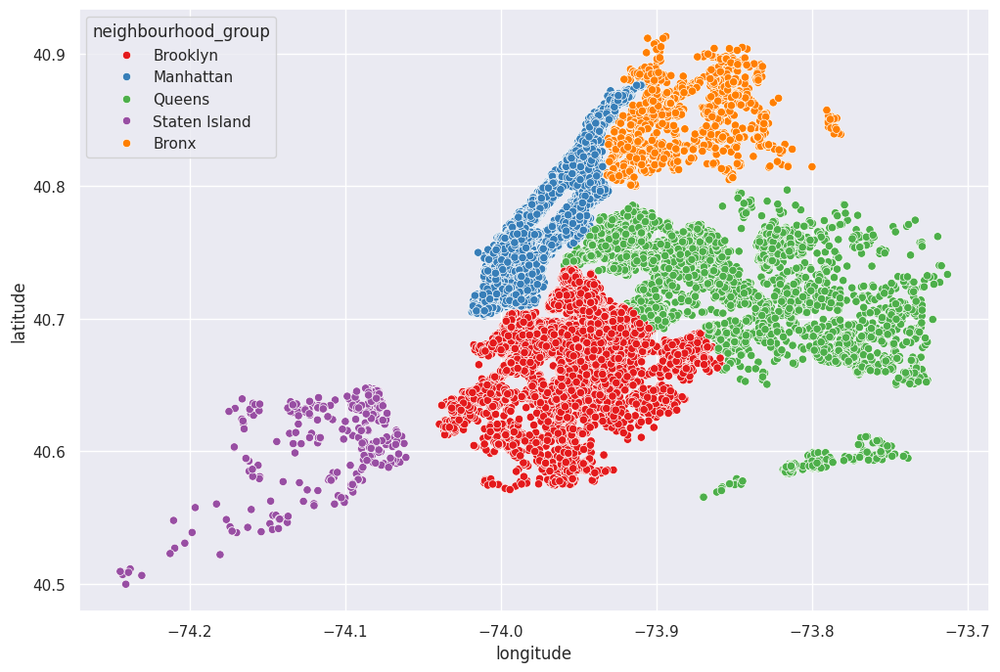

In [34]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x='longitude', y='latitude', data=df, hue='neighbourhood_group', palette='Set1');

## Room Type Analysis

In [35]:
df['room_type'].value_counts()

,count
room_type,
Entire home/apt,25409
Private room,22326
Shared room,1160


In [36]:
px.pie(df, names='room_type', title='Room Type')

In [37]:
df.groupby('room_type')['price'].mean().sort_values(ascending=False)

,price
room_type,
Entire home/apt,211.79
Private room,89.78
Shared room,70.13


In [38]:
px.bar(df.groupby('room_type')['price'].mean().sort_values(ascending=False), title='Room Type')

    the most popular and expensive 'room_type' is `Entire home/apt`
    the least popular and expensive 'room_type' is `Shared room`

## Price Analysis

In [39]:
df['price'].describe()

,price
count,"48,895.00"
mean,152.72
std,240.15
min,0.00
25%,69.00
50%,106.00
75%,175.00
max,"10,000.00"


    remove prices that equal 0

In [40]:
df = df[df['price']!=0]

In [41]:
df['price'].describe()

,price
count,"48,884.00"
mean,152.76
std,240.17
min,10.00
25%,69.00
50%,106.00
75%,175.00
max,"10,000.00"


    the mean of prices is 152
    the least expensive price is 10

## Minimum Nights Analysis

In [42]:
df['minimum_nights'].describe()

,minimum_nights
count,"48,884.00"
mean,7.03
std,20.51
min,1.00
25%,1.00
50%,3.00
75%,5.00
max,"1,250.00"


<Axes: xlabel='minimum_nights'>

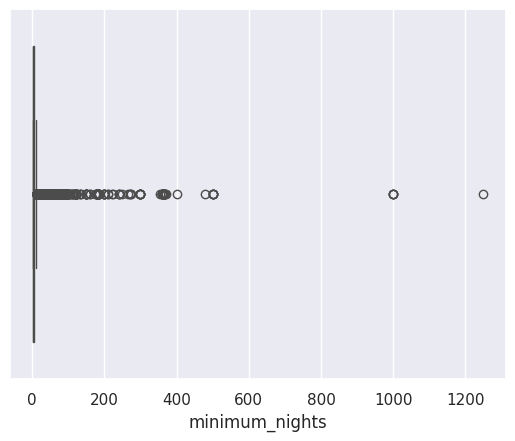

In [43]:
sns.boxplot(x=df['minimum_nights'])

    there are outliers

## Availability Analysis

In [44]:
df['availability_365'].describe()

,availability_365
count,"48,884.00"
mean,112.78
std,131.63
min,0.00
25%,0.00
50%,45.00
75%,227.00
max,365.00


In [45]:
df['availability_365'].value_counts()

,count
availability_365,
0,17530
365,1295
364,491
1,408
89,361
...,...
195,26
183,24
196,24


    there are '756' places never booked
    there are '15682' alwayes booked

## Reviews Analysis

In [46]:
px.histogram(df, x='reviews_per_month')

In [47]:
px.histogram(df, x='number_of_reviews')

## Distance Analysis

In [48]:
df['distance'].describe()

,distance
count,"48,884.00"
mean,7.44
std,4.51
min,0.04
25%,4.39
50%,6.47
75%,9.61
max,30.90


In [49]:
df.groupby('neighbourhood_group')['distance'].mean().sort_values(ascending=False)

,distance
neighbourhood_group,
Bronx,18.35
Staten Island,14.33
Queens,12.34
Manhattan,6.55
Brooklyn,6.31


    the nearst to city center are `Brooklyn` and `Manhattan`
    the farest to city center is `Bronx`

# Conclusion

- **Neighbourhood Group:**  
  - **Manhattan** and **Brooklyn** are the most popular and expensive groups, especially for *Entire home/apt* and *Private room*.  
  - **Bronx** is the farthest from the city center and less popular.  

- **Neighbourhood:**  
  - The most popular neighbourhoods are **Williamsburg** and **Bedford-Stuyvesant**.  
  - The most expensive is **Fort Wadsworth**, while the least expensive is **Bull's Head**.  

- **Room Type:**  
  - *Entire home/apt* is the most popular and expensive room type.  
  - *Shared room* is the least popular and cheapest.  

- **Price:**  
  - The **average price** is around **$152**, with the lowest valid price being **$10**.  
  - Listings with a price of **$0** were excluded from the analysis.  

- **Minimum Nights:**  
  - Some listings show extreme outliers, requiring unusually long stays compared to the majority.  

- **Availability:**  
  - Some listings are **never booked**, while others are **available year-round**, showing wide variation in booking frequency.  

- **Reviews:**  
  - Most listings receive **few reviews per month**, while a smaller group of properties receives **a very high number of reviews**.  

- **Distance:**  
  - Properties in **Brooklyn** and **Manhattan** are closer to the city center.  
  - **Bronx** is the farthest on average.  


**Overall Insight:**  
These findings highlight that **location (borough & neighbourhood)** and **room type** are the main drivers of both **price** and **popularity** in New York City’s Airbnb market. This knowledge can help **hosts** optimize pricing and availability, and help **guests** choose the best locations and room types for their needs.  